<a href="https://colab.research.google.com/github/FBI-openup/M1-MLassessment-/blob/main/Labs/Lab-CP-tuto/TP_cp_classif.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/adieulev/Certificate-DS-2024/blob/main/Labs/Lab-CP-tuto/TP_cp_classif.ipynb)

# Conformal prediction for classification purpose
Inspired by the tutorial of Angelopoulos

In [1]:
import requests

exec(requests.get("https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/refs/heads/main/Labs/get-send-code.html").content)

npt_config = {
    'session_name': 'TutoCP',
    'session_owner': 'aymeric',
    'sender_name': input("Your name:"),
}
send('started', 0)

Your name:victor


<Response [200]>

In [2]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
!pip install -U --no-cache-dir gdown --pre

## Data preparation

### Load the data

In this cell, we prepare all necessary data for model evaluation, visualization, or analysis based on the ImageNet dataset and ResNet-152 predictions.

- Check if the ../data directory exists; if not, it downloads a .tar.gz archive using gdown, extracts it, and removes the archive.

- Ensure the human-readable ImageNet labels JSON file is present; if missing, it downloads it via wget.

- Load precomputed softmax outputs (smx) and corresponding label indices (labels) from a .npz file.

- Convert the labels to integers for further processing or evaluation.

- Read the list of example image file paths from the ../data/imagenet/examples directory.


In [3]:
# Check if the '../data' directory exists
if not os.path.exists('../data'):
    # If not, download the data archive from Google Drive using gdown
    os.system('gdown 1h7S6N_Rx7gdfO3ZunzErZy6H7620EbZK -O ../data.tar.gz')
    # Extract the contents of the tar.gz archive to the parent directory
    os.system('tar -xf ../data.tar.gz -C ../')
    # Remove the archive file after extraction
    os.system('rm ../data.tar.gz')

# Check if the human-readable ImageNet labels JSON file exists
if not os.path.exists('../data/imagenet/human_readable_labels.json'):
    # If not, download it from the specified GitHub URL using wget
    !wget -nv -O ../data/imagenet/human_readable_labels.json -L https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json

# Load the precomputed softmax outputs and labels from a NumPy .npz file
data = np.load('../data/imagenet/imagenet-resnet152.npz')

# Get a list of file names in the 'examples' directory
example_paths = os.listdir('../data/imagenet/examples')

# Extract the softmax predictions from the loaded data
smx = data['smx']

# Convert the loaded label data to integers
labels = data['labels'].astype(int)


In [4]:
smx.shape, labels.shape

((50000, 1000), (50000,))

### Setting parameters for conformal prediction

In [5]:
# Problem setup
n_cal = 1000    # number of calibration points
alpha = 0.1     # 1-alpha is the desired coverage

### Splitting the data

In [6]:
# Split the softmax scores into calibration and validation sets (save the shuffling)

idx = np.array([1] * n_cal + [0] * (smx.shape[0]-n_cal)) > 0
# np.random.seed(42)
np.random.shuffle(idx)

cal_smx, test_smx = smx[idx,:], smx[~idx,:]
cal_labels, test_labels = labels[idx], labels[~idx]

### Understanding what is stored in the data

The first 10 labels in the calibration set are  [ 3  4  4  4  5  5  8  8 10 11]
The minimal label is  3
The maximal label is  999


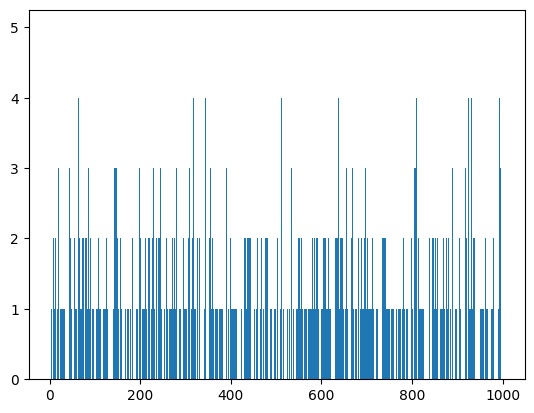

In [7]:
# Zoom on the labels in the calibration set
print("The first 10 labels in the calibration set are ", cal_labels[:10])
print("The minimal label is ", np.min(cal_labels))
print("The maximal label is ", np.max(cal_labels))
plt.hist(cal_labels, bins=1000);

The first 10 labels in the test set are  [0 0 0 0 0 0 0 0 0 0]
The minimal label is  0
The maximal label is  999


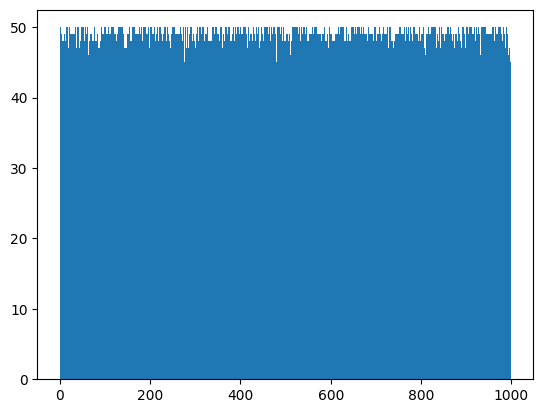

In [8]:
# Zoom on the labels in the test set
print("The first 10 labels in the test set are ", test_labels[:10])
print("The minimal label is ",np.min(test_labels))
print("The maximal label is ",np.max(test_labels))
plt.hist(test_labels,bins=1000);

In [9]:
print("The total number of different labels in the dataset:",len(np.unique(labels)))

The total number of different labels in the dataset: 1000


The sum of a row of cal_smx gives  1.0000001442213473


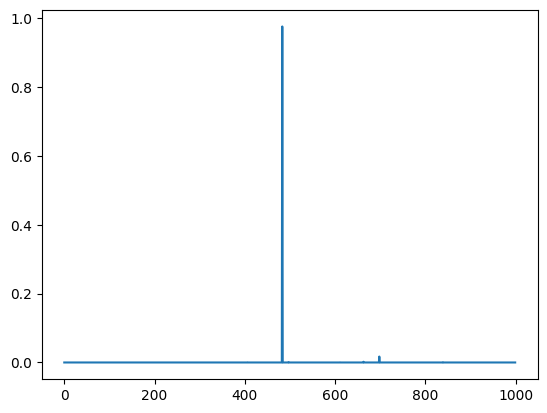

In [33]:
# Look at a row of cal_smx: this corresponds to the predicted probabilities
# (the training has been already performed)
plt.plot(cal_smx[490])
print("The sum of a row of cal_smx gives ",np.sum(cal_smx[450]))

In [34]:
# Sort cal_smx[450] in decreasing order an give top ten values
top_indices = np.argsort(cal_smx[450])[::-1][:10]        # Indices of top 10 values (sorted)
top_values = cal_smx[450][top_indices]
top_values

array([9.99922872e-01, 1.28309821e-05, 1.17770642e-05, 7.38006929e-06,
       5.38215136e-06, 4.13592943e-06, 3.16793171e-06, 3.10910355e-06,
       2.73692217e-06, 2.01406124e-06])

### A first way for conformal prediction

In this section, we implement the first strategy:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol1.png)



To that end:

<div class="alert alert-block alert-info">
    1. For each calibration point, compute a score. <br>
    2. And then evaluate an empirical quantile of the calibration scores.  
</div>



In [12]:
# 1: get conformal scores
cal_scores = 1-cal_smx[np.arange(n_cal),cal_labels]             # TODO OPERAND



# 2: get adjusted quantile
q_level = np.ceil((n_cal+1)*(1-alpha))/n_cal                    # TODO OPERAND
qhat = np.quantile(cal_scores, q_level, interpolation='higher') # TODO OPERAND


In [13]:
cal_scores[1:10]

array([1.52707100e-04, 8.43852773e-01, 6.93441421e-01, 2.18652487e-02,
       4.05234098e-03, 9.45764780e-03, 4.18099761e-02, 1.03235245e-04,
       5.63019514e-03])

In [14]:
qhat

np.float64(0.9501992762088776)

<div class="alert alert-block alert-info">
    3. Form the prediction sets for the test set
</div>

In [15]:
# 3: form prediction sets
prediction_sets = test_smx >= (1-qhat) # 3: form prediction sets

In [16]:
prediction_sets.shape

(49000, 1000)

<div class="alert alert-block alert-info">
    4. Compute the empirical coverage
</div>

In [17]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(prediction_sets.shape[0]),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

send(["The empirical coverage is:", empirical_coverage], 1)
send(["The empirical average set size is:", empirical_average_set_size], 2)

The empirical coverage is: 0.8983265306122449
The empirical average set size is: 1.7445510204081633


<Response [200]>

<div class="alert alert-block alert-info">
    5. Illustrate prediction sets for some points of the test set
</div>

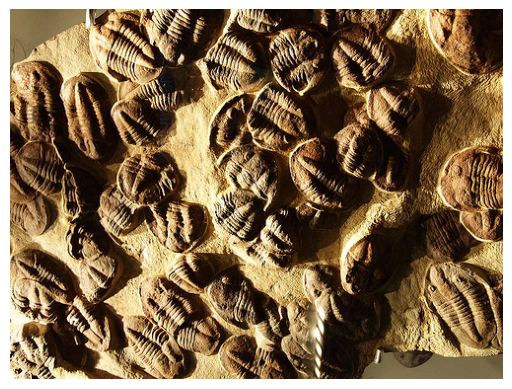

The prediction set is: [np.str_('trilobite')]


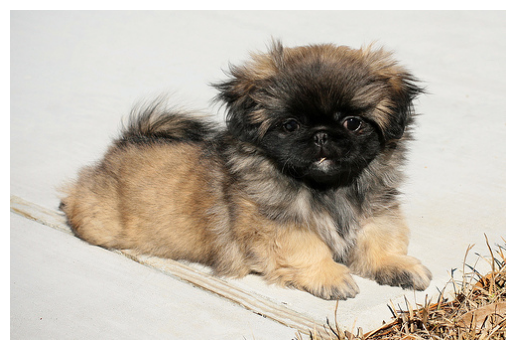

The prediction set is: [np.str_('Pekingese')]


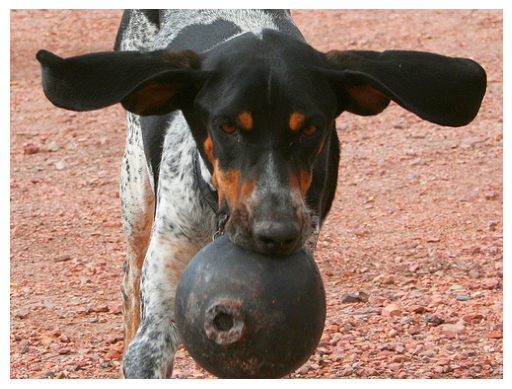

The prediction set is: [np.str_('Bluetick Coonhound')]


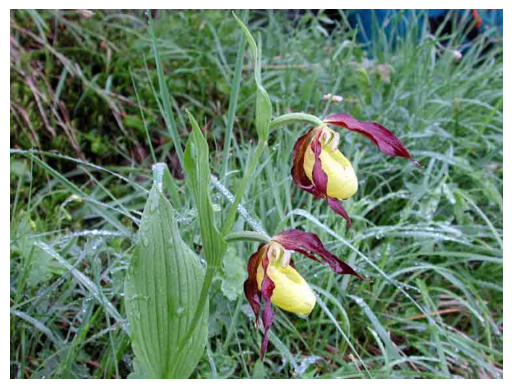

The prediction set is: [np.str_("yellow lady's slipper")]


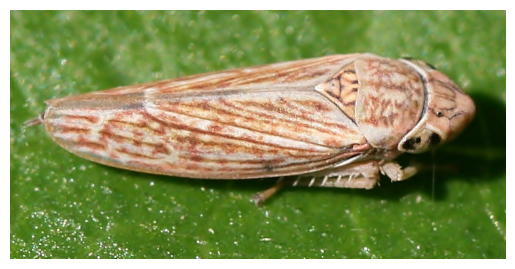

The prediction set is: [np.str_('leafhopper')]


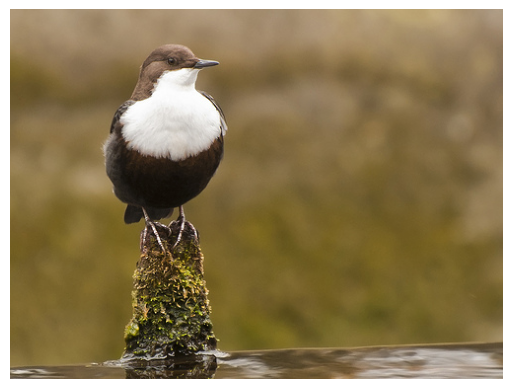

The prediction set is: [np.str_('American dipper')]


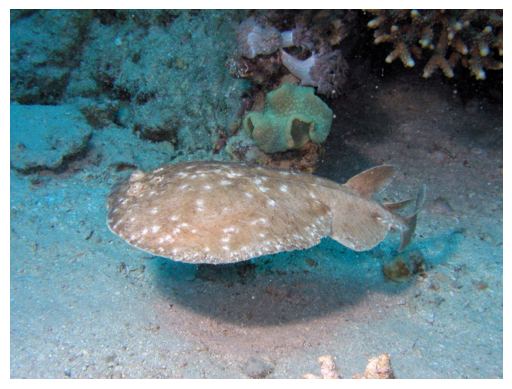

The prediction set is: [np.str_('electric ray')]


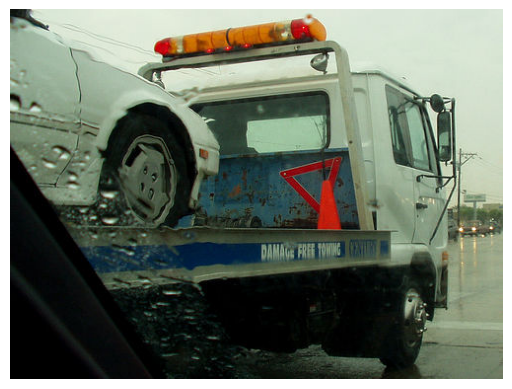

The prediction set is: [np.str_('garbage truck'), np.str_('snowplow'), np.str_('tow truck')]


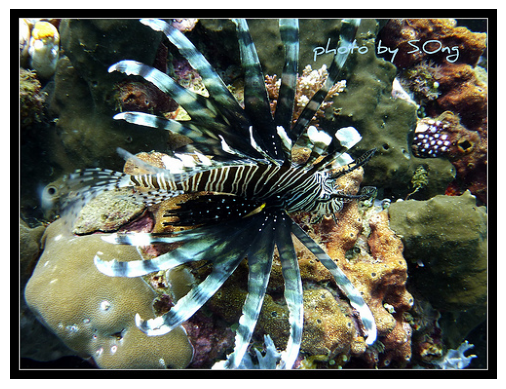

The prediction set is: [np.str_('lionfish')]


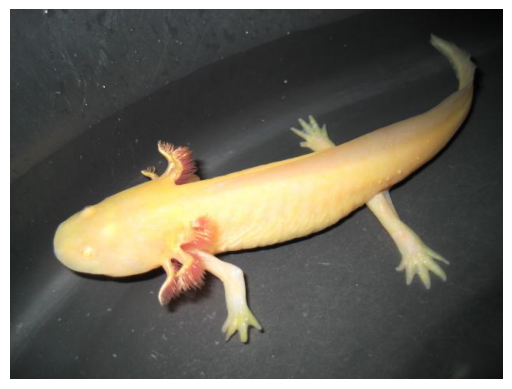

The prediction set is: [np.str_('axolotl')]


In [18]:
# Making the labels human-readable
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

# Show some examples
example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    #
    prediction_set = smx[img_index] > 1-qhat #TODO OPERAND
    #
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 3)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

<div class="alert alert-block alert-success">This method leads to <b>small prediction sets</b>, but sacrifices <b>adaptivity</b>. </div>



## Towards more adaptive prediction sets

In this section, we are interested in the second solution:

![Solution Image](https://raw.githubusercontent.com/adieulev/Certificate-DS-2025/main/Labs/Lab-CP-tuto/tutosol2.png)


<div class="alert alert-block alert-info">
    <ol>
<li>Sort in decreasing order $\hat{p}_{\sigma_i(1)}(X_i) \geq ... \geq  \hat{p}_{\sigma_i(C)}(X_i)$</li>
   

To that end:

<li> Compute the calibration scores $S_i = \sum_{k=1}^{\sigma_i^{-1}(Y_i)} \hat{p}_{\sigma_i(k)}(X_i)$ (sum of the estimated probabilities associated to classes at least as large as that of the true class $Y_i$)} </li>
    <li> Get the quantile $q_{1-\alpha}(\mathcal{S})$ </li>
<li> Return the classes $\sigma_{\text{new}}(1),... ,\sigma_{\text{new}}(r^\star)$ where $r^{\star} = \text{argmax}_{1 \leq r \leq C}\left\{ \sum_{k=1}^{r} \hat{p}_{\sigma_{\text{new}}(k)}(X_{\text{new}}) < q_{1-\alpha}(\mathcal{S}) \right\} + 1$</li>
         </ol>

NB : to avoid the +1, you can use the corrected quantile ;)

In [19]:
# true_probs = cal_smx[np.arange(n_cal), cal_labels]
# print("True probs 90% quantile:", np.quantile(true_probs, 0.1))  # Should be > 0.07
# print("True probs 50% quantile:", np.quantile(true_probs, 0.5))  # Median

In [20]:
# true_ranks = (cal_pi == cal_labels[:, None]).argmax(axis=1)
# print("True rank 90% quantile:", np.quantile(true_ranks, 0.9))
# print("True rank max:", true_ranks.max())


In [21]:
# 1. Get for each row the indices that would sort the probabilities in descending order
cal_pi = cal_smx.argsort(1)[:, ::-1]  #TODO OPERAND # shape: (n_cal, n_classes)

#argsort in increasing order, so order reverting by [:,::-1]


# 2. Use the sorted indices to get the sorted probabilities in descending order
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1) #TODO OPERAND  # shape: (n_cal, n_classes)

# 3. Get the rank (position) of the true label in the sorted index array
# cal_L = np.where(cal_pi == cal_labels[:, None])[1]  #TODO OPERAND # shape: (n_cal,)
# For each row, find at which index the true label appears in the sorted predictions
cal_L = (cal_pi == cal_labels[:, None]).argmax(axis=1)  # row-wise rank of the true label

# 4. Compute the cumulative probability up to the true label — the conformal score
cal_scores = cal_srt.cumsum(axis=1)[np.arange(n_cal), cal_L] #TODO OPERAND
# This is the sum of predicted probabilities (in descending order) up to and including the true label

# 5. Compute the quantile threshold for calibration
qhat = np.quantile(
    cal_scores,
    np.ceil((n_cal + 1) * (1 - alpha)) / n_cal,
    method='higher'  # use 'interpolation' only for old NumPy; 'method' is preferred in newer versions
)


In [22]:
qhat

np.float64(0.9999366998672485)

In [23]:
# Deploy on the test set
n_test = test_smx.shape[0]

# sorting the predicted probabilities (softmax outputs) on the test set
test_pi = test_smx.argsort(1)[:,::-1] #TODO OPERAND

# reordering
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) #TODO OPERAND

#test_srt_cumsum = test_srt.cumsum(axis=1)
# cumulative softmax outputs
indicators = test_srt.cumsum(axis=1) <= qhat #TODO OPERAND
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1) #TODO OPERAND


In [24]:
# Calculate empirical coverage

empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean() #TODO OPERAND
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")
send(["The empirical coverage is:", empirical_coverage], 4)
send(["The empirical average set size is:", empirical_average_set_size], 5)

The empirical coverage is: 0.914530612244898
The empirical average set size is: 242.72097959183674
The quantile is: 0.9999366998672485


<Response [200]>

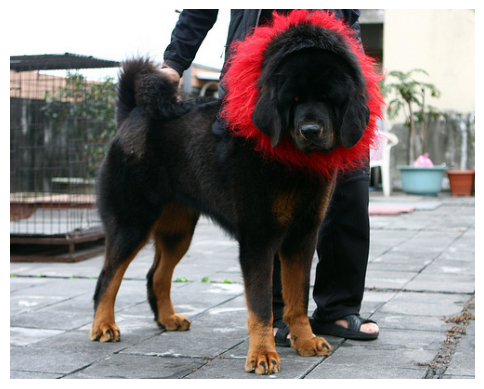

The prediction set is: [np.str_('Tibetan Terrier'), np.str_('Tibetan Mastiff')]


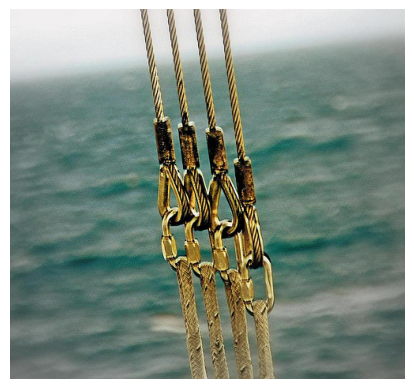

The prediction set is: [np.str_('great white shark'), np.str_('tiger shark'), np.str_('hammerhead shark'), np.str_('electric ray'), np.str_('stingray'), np.str_('ostrich'), np.str_('house finch'), np.str_('indigo bunting'), np.str_('chickadee'), np.str_('American dipper'), np.str_('leatherback sea turtle'), np.str_('harvestman'), np.str_('scorpion'), np.str_('yellow garden spider'), np.str_('barn spider'), np.str_('European garden spider'), np.str_('tick'), np.str_('centipede'), np.str_('peacock'), np.str_('bee eater'), np.str_('black swan'), np.str_('jellyfish'), np.str_('conch'), np.str_('Dungeness crab'), np.str_('rock crab'), np.str_('fiddler crab'), np.str_('red king crab'), np.str_('spiny lobster'), np.str_('crayfish'), np.str_('hermit crab'), np.str_('isopod'), np.str_('spoonbill'), np.str_('flamingo'), np.str_('little blue heron'), np.str_('great egret'), np.str_('crane (bird)'), np.str_('limpkin'), np.str_('American coot'), np.str_('ruddy turnstone'), np.str_('dunlin'), np.str

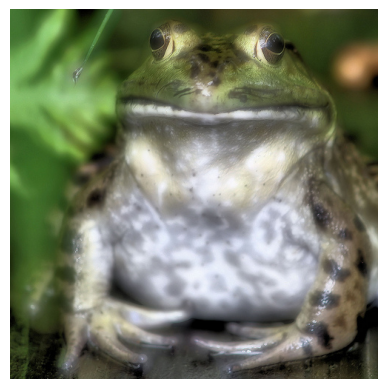

The prediction set is: [np.str_('American bullfrog'), np.str_('tree frog'), np.str_('tailed frog')]


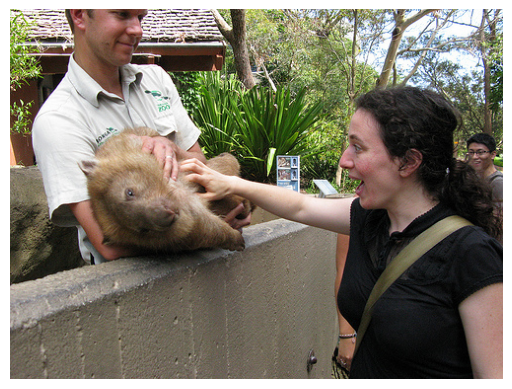

The prediction set is: [np.str_('hen'), np.str_('terrapin'), np.str_('box turtle'), np.str_('green iguana'), np.str_('Gila monster'), np.str_('Komodo dragon'), np.str_('Nile crocodile'), np.str_('triceratops'), np.str_('worm snake'), np.str_('eastern hog-nosed snake'), np.str_('smooth green snake'), np.str_('night snake'), np.str_('boa constrictor'), np.str_('African rock python'), np.str_('green mamba'), np.str_('eastern diamondback rattlesnake'), np.str_('tarantula'), np.str_('tick'), np.str_('quail'), np.str_('grey parrot'), np.str_('macaw'), np.str_('sulphur-crested cockatoo'), np.str_('lorikeet'), np.str_('echidna'), np.str_('platypus'), np.str_('wallaby'), np.str_('koala'), np.str_('wombat'), np.str_('dugong'), np.str_('sea lion'), np.str_('Redbone Coonhound'), np.str_('Irish Wolfhound'), np.str_('Border Terrier'), np.str_('Irish Terrier'), np.str_('Norfolk Terrier'), np.str_('Norwich Terrier'), np.str_('Lakeland Terrier'), np.str_('Airedale Terrier'), np.str_('Cairn Terrier'), n

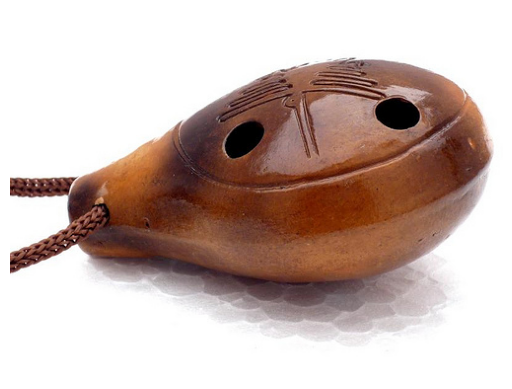

The prediction set is: []


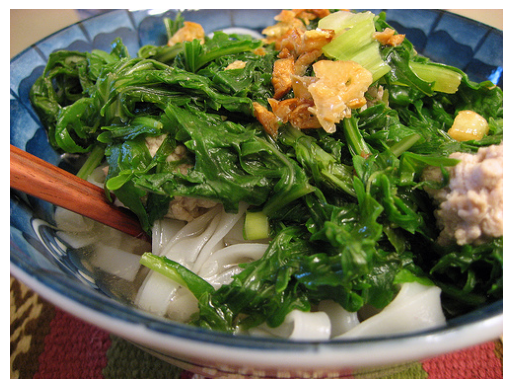

The prediction set is: [np.str_('tench'), np.str_('goldfish'), np.str_('great white shark'), np.str_('hammerhead shark'), np.str_('electric ray'), np.str_('stingray'), np.str_('cock'), np.str_('hen'), np.str_('goldfinch'), np.str_('house finch'), np.str_('junco'), np.str_('indigo bunting'), np.str_('American robin'), np.str_('bulbul'), np.str_('jay'), np.str_('magpie'), np.str_('fire salamander'), np.str_('smooth newt'), np.str_('newt'), np.str_('spotted salamander'), np.str_('axolotl'), np.str_('American bullfrog'), np.str_('tree frog'), np.str_('tailed frog'), np.str_('mud turtle'), np.str_('terrapin'), np.str_('box turtle'), np.str_('green iguana'), np.str_('Carolina anole'), np.str_('desert grassland whiptail lizard'), np.str_('agama'), np.str_('frilled-necked lizard'), np.str_('alligator lizard'), np.str_('European green lizard'), np.str_('chameleon'), np.str_('Komodo dragon'), np.str_('Nile crocodile'), np.str_('American alligator'), np.str_('triceratops'), np.str_('worm snake'),

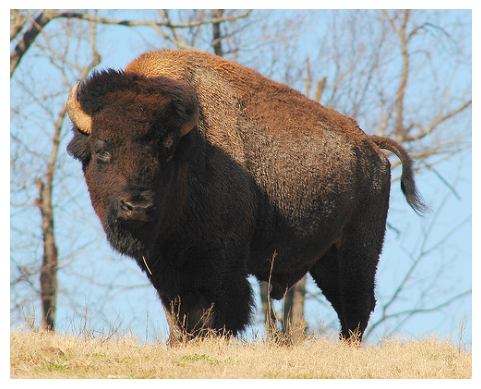

The prediction set is: []


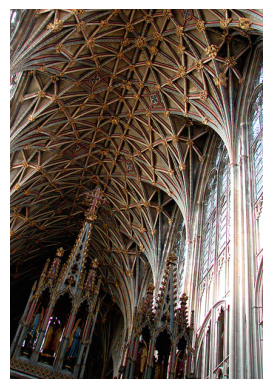

The prediction set is: [np.str_('goldfish'), np.str_('cock'), np.str_('hen'), np.str_('ostrich'), np.str_('brambling'), np.str_('goldfinch'), np.str_('house finch'), np.str_('junco'), np.str_('indigo bunting'), np.str_('American robin'), np.str_('bulbul'), np.str_('jay'), np.str_('magpie'), np.str_('chickadee'), np.str_('American dipper'), np.str_('kite'), np.str_('bald eagle'), np.str_('vulture'), np.str_('great grey owl'), np.str_('axolotl'), np.str_('mud turtle'), np.str_('box turtle'), np.str_('banded gecko'), np.str_('green iguana'), np.str_('Carolina anole'), np.str_('desert grassland whiptail lizard'), np.str_('agama'), np.str_('frilled-necked lizard'), np.str_('alligator lizard'), np.str_('Gila monster'), np.str_('European green lizard'), np.str_('Komodo dragon'), np.str_('Nile crocodile'), np.str_('American alligator'), np.str_('triceratops'), np.str_('worm snake'), np.str_('ring-necked snake'), np.str_('smooth green snake'), np.str_('kingsnake'), np.str_('water snake'), np.st

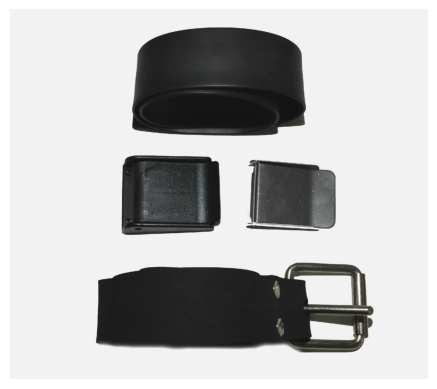

The prediction set is: [np.str_('electric ray'), np.str_('junco'), np.str_('trilobite'), np.str_('centipede'), np.str_('American coot'), np.str_('oystercatcher'), np.str_('Chihuahua'), np.str_('Pekingese'), np.str_('toy terrier'), np.str_('Basset Hound'), np.str_('Beagle'), np.str_('Bloodhound'), np.str_('Bluetick Coonhound'), np.str_('Black and Tan Coonhound'), np.str_('Treeing Walker Coonhound'), np.str_('English foxhound'), np.str_('Redbone Coonhound'), np.str_('Italian Greyhound'), np.str_('Whippet'), np.str_('Ibizan Hound'), np.str_('Otterhound'), np.str_('Saluki'), np.str_('Weimaraner'), np.str_('Border Terrier'), np.str_('Irish Terrier'), np.str_('Norfolk Terrier'), np.str_('Boston Terrier'), np.str_('Flat-Coated Retriever'), np.str_('Curly-coated Retriever'), np.str_('Golden Retriever'), np.str_('Labrador Retriever'), np.str_('German Shorthaired Pointer'), np.str_('Vizsla'), np.str_('Irish Setter'), np.str_('Brittany'), np.str_('English Springer Spaniel'), np.str_('Cocker Spani

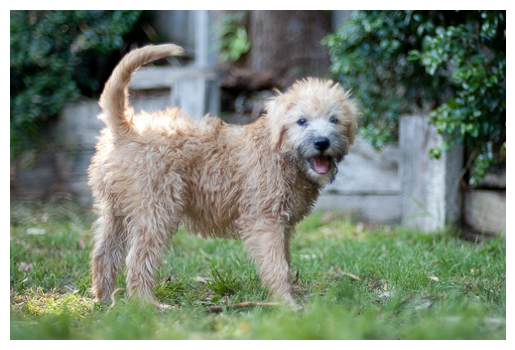

The prediction set is: [np.str_('house finch'), np.str_('green iguana'), np.str_('barn spider'), np.str_('European garden spider'), np.str_('conch'), np.str_('flamingo'), np.str_('crane (bird)'), np.str_('Chihuahua'), np.str_('Maltese'), np.str_('Shih Tzu'), np.str_('toy terrier'), np.str_('Rhodesian Ridgeback'), np.str_('Afghan Hound'), np.str_('Bloodhound'), np.str_('English foxhound'), np.str_('Redbone Coonhound'), np.str_('borzoi'), np.str_('Irish Wolfhound'), np.str_('Whippet'), np.str_('Ibizan Hound'), np.str_('Otterhound'), np.str_('Saluki'), np.str_('Scottish Deerhound'), np.str_('Staffordshire Bull Terrier'), np.str_('American Staffordshire Terrier'), np.str_('Bedlington Terrier'), np.str_('Border Terrier'), np.str_('Kerry Blue Terrier'), np.str_('Irish Terrier'), np.str_('Norfolk Terrier'), np.str_('Norwich Terrier'), np.str_('Yorkshire Terrier'), np.str_('Wire Fox Terrier'), np.str_('Lakeland Terrier'), np.str_('Sealyham Terrier'), np.str_('Airedale Terrier'), np.str_('Cairn

In [25]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set


    _smx = smx[img_index]         #TODO OPERAND
    _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
    _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
    _srt_cumsum = _srt.cumsum()        #TODO OPERAND
    _ind = _srt_cumsum <= qhat  #TODO OPERAND

#     _smx = smx[img_index]         #TODO OPERAND
#     _pi = np.argsort(_smx)[::-1]  #TODO OPERAND
#     _srt = np.take_along_axis(_smx,_pi,axis=0) #TODO OPERAND
#     _srt_reg_cumsum = _srt_reg.cumsum()        #TODO OPERAND
#     _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat #TODO OPERAND

    # if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    send(plt, 6)
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")

In [26]:
cal_pi = cal_smx.argsort(1)[:, ::-1]  # Indices that sort each row descending
cal_srt = np.take_along_axis(cal_smx, cal_pi, axis=1)  # Sorted softmax values
# Check if each row is sorted
assert np.all(np.diff(cal_srt, axis=1) <= 1e-6)

cal_L = (cal_pi == cal_labels[:, None]).argmax(axis=1)


# Check that it matches softmax
true_probs_from_srt = cal_srt[np.arange(n_cal), cal_L]
true_probs_direct = cal_smx[np.arange(n_cal), cal_labels]
np.testing.assert_allclose(true_probs_from_srt, true_probs_direct, rtol=1e-5)

cal_scores = cal_srt.cumsum(axis=1)[np.arange(n_cal), cal_L]
for i in range(5):
    print("True label prob:", cal_smx[i, cal_labels[i]])
    print("Sorted probs:", cal_srt[i, :10])
    print("Cumulative sum up to true label:", cal_scores[i])
    print("True label rank:", cal_L[i])
    print("-" * 40)

True label prob: 0.6128827929496765
Sorted probs: [6.12882793e-01 3.40693474e-01 3.38538177e-02 2.69563915e-03
 1.79224380e-03 1.09564350e-03 1.00506924e-03 5.91876626e-04
 5.51434583e-04 5.13070147e-04]
Cumulative sum up to true label: 0.6128827929496765
True label rank: 0
----------------------------------------
True label prob: 0.9998472929000854
Sorted probs: [9.99847293e-01 1.01637925e-04 4.83437325e-05 1.27847159e-06
 6.17594367e-07 1.84040815e-07 1.67223689e-07 5.92670375e-08
 5.53867530e-08 4.68105448e-08]
Cumulative sum up to true label: 0.9998472929000854
True label rank: 0
----------------------------------------
True label prob: 0.15614722669124603
Sorted probs: [4.93090183e-01 3.25228393e-01 1.56147227e-01 1.40452366e-02
 6.28268253e-03 1.74849399e-03 1.16265495e-03 1.12489844e-03
 5.32872160e-04 2.22283561e-04]
Cumulative sum up to true label: 0.9744658023118973
True label rank: 2
----------------------------------------
True label prob: 0.3065585792064667
Sorted probs: [

What happens here ?
- many ponts are very well predicted !
- those lead to high scores, because the cumulatove probability to include the point is close to 1.


## Another way for adaptive predictive sets in classification


[Sadinle, Lei, Wasserman] https://arxiv.org/abs/1609.00451


[Notebook source](https://github.com/aangelopoulos/conformal-prediction/blob/main/notebooks/imagenet-raps.ipynb)

In [27]:
# Set RAPS regularization parameters (larger lam_reg and smaller k_reg leads to smaller sets)
lam_reg = 0.01
k_reg = 5
disallow_zero_sets = False # Set this to False in order to see the coverage upper bound hold
rand = True # Set this to True in order to see the coverage upper bound hold
reg_vec = np.array(k_reg*[0,] + (smx.shape[1]-k_reg)*[lam_reg,])[None,:] # create a row with 5 zeroes and the rest at 0.01

In [28]:
# Get scores

# get for each row the position of the predicted probabilities in decreasing order
cal_pi = cal_smx.argsort(1)[:,::-1] #argsort in increasing order, so order reverting by [:,::-1]

# form for each row the predicted probabilities in decreasing order
cal_srt = np.take_along_axis(cal_smx,cal_pi,axis=1)

cal_srt_reg = cal_srt + reg_vec # addition row by row of 0 0 0 0 0 0.1 0.1 ....

# get the rank of the true label in the sorted predicted probabilities
cal_L = np.where(cal_pi == cal_labels[:,None])[1]

# compute the calibration scores (why minus something????)
cal_scores = cal_srt_reg.cumsum(axis=1)[np.arange(n_cal),cal_L] - np.random.rand(n_cal)*cal_srt_reg[np.arange(n_cal),cal_L]

# Get the score quantile
qhat = np.quantile(cal_scores, np.ceil((n_cal+1)*(1-alpha))/n_cal, interpolation='higher')


In [29]:
qhat

np.float64(0.948476614524652)

In [30]:
# Deploy
n_test = test_smx.shape[0]
test_pi = test_smx.argsort(1)[:,::-1] # sorting the predicted probabilities (softmax outputs) on the test set
test_srt = np.take_along_axis(test_smx,test_pi,axis=1) # reordering
test_srt_reg = test_srt + reg_vec # ???
test_srt_reg_cumsum = test_srt_reg.cumsum(axis=1) # cumulative softmax outputs
indicators = (test_srt_reg.cumsum(axis=1) - np.random.rand(n_test,1)*test_srt_reg) <= qhat if rand else test_srt_reg.cumsum(axis=1) - test_srt_reg <= qhat
if disallow_zero_sets: indicators[:,0] = True
prediction_sets = np.take_along_axis(indicators,test_pi.argsort(axis=1),axis=1)

In [31]:
# Calculate empirical coverage
empirical_coverage = prediction_sets[np.arange(n_test),test_labels].mean()
print(f"The empirical coverage is: {empirical_coverage}")

empirical_average_set_size = prediction_sets.sum(axis=1).mean()
print(f"The empirical average set size is: {empirical_average_set_size}")

print(f"The quantile is: {qhat}")

send(["The empirical coverage is:", empirical_coverage], 7)
send(["The empirical average set size is:", empirical_average_set_size], 8)

The empirical coverage is: 0.8995714285714286
The empirical average set size is: 3.0058979591836734
The quantile is: 0.948476614524652


<Response [200]>

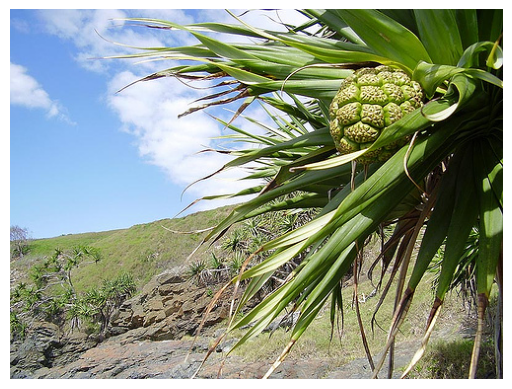

The prediction set is: [np.str_('pineapple'), np.str_('custard apple')]


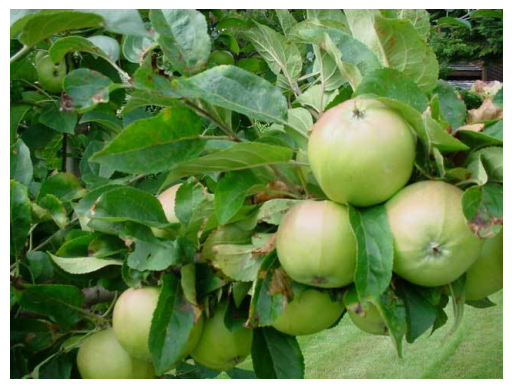

The prediction set is: [np.str_('spaghetti squash'), np.str_('butternut squash'), np.str_('bell pepper'), np.str_('Granny Smith'), np.str_('acorn')]


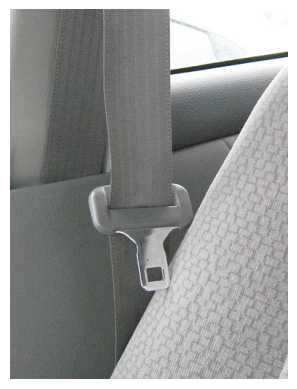

The prediction set is: [np.str_('seat belt')]


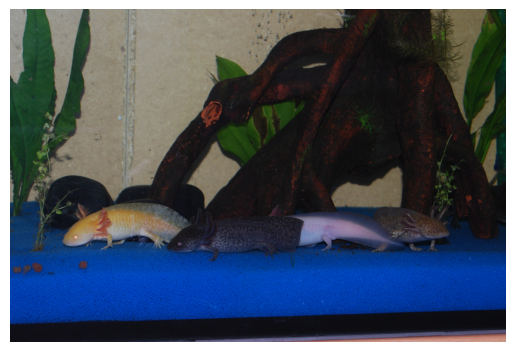

The prediction set is: [np.str_('axolotl')]


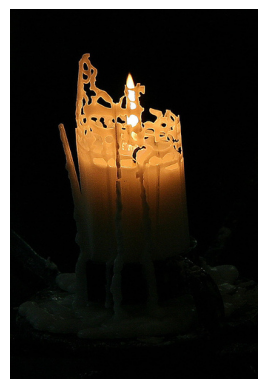

The prediction set is: [np.str_('bell-cot'), np.str_('candle'), np.str_('castle'), np.str_('chime'), np.str_('cliff dwelling'), np.str_('fountain'), np.str_("jack-o'-lantern"), np.str_('jigsaw puzzle'), np.str_('lampshade'), np.str_('match'), np.str_('obelisk'), np.str_('spotlight'), np.str_('table lamp'), np.str_('throne'), np.str_('torch'), np.str_('coral fungus')]


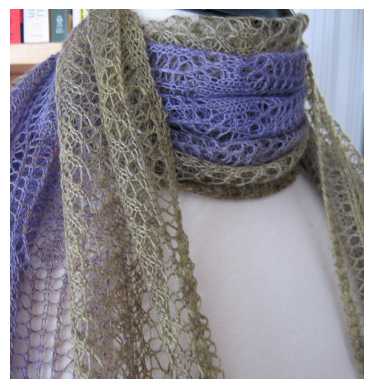

The prediction set is: []


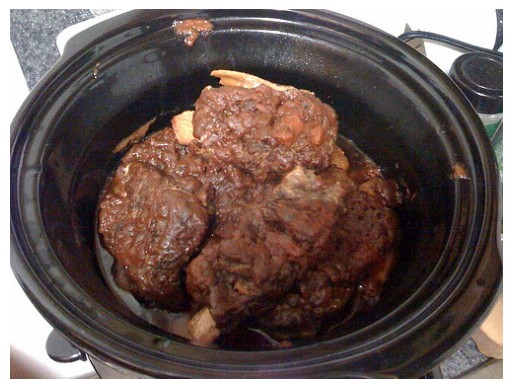

The prediction set is: [np.str_('Crock Pot')]


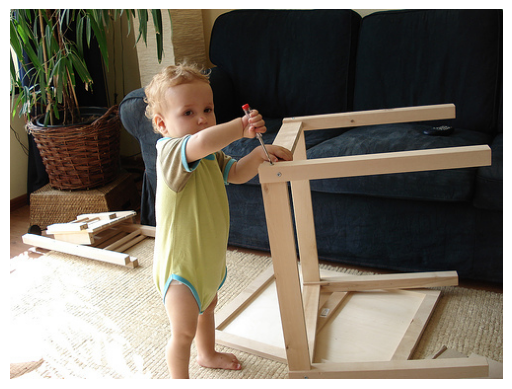

The prediction set is: [np.str_('Band-Aid'), np.str_('hammer'), np.str_('lighter'), np.str_('lipstick'), np.str_('match'), np.str_('paintbrush'), np.str_('ping-pong ball'), np.str_('soda bottle'), np.str_('power drill'), np.str_('ruler'), np.str_('screw'), np.str_('screwdriver'), np.str_('spatula'), np.str_('sunscreen'), np.str_('syringe'), np.str_('water bottle'), np.str_('ice pop')]


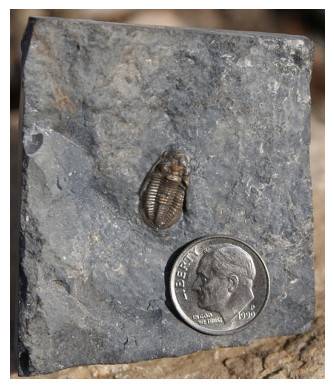

The prediction set is: [np.str_('trilobite')]


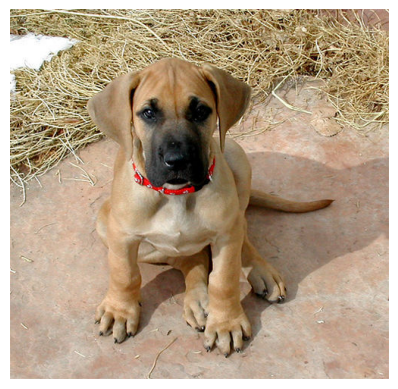

The prediction set is: [np.str_('Bullmastiff'), np.str_('Great Dane')]


In [32]:
# Show some examples
with open('../data/imagenet/human_readable_labels.json') as f:
    label_strings = np.array(json.load(f))

example_paths =os.listdir('../data/imagenet/examples')
for i in range(10):
    rand_path = np.random.choice(example_paths)
    img = imread('../data/imagenet/examples/' + rand_path )
    img_index = int(rand_path.split('.')[0])
    # Form the prediction set
    _smx = smx[img_index]
    _pi = np.argsort(_smx)[::-1]
    _srt = np.take_along_axis(_smx,_pi,axis=0)
    _srt_reg = _srt + reg_vec.squeeze()
    _srt_reg_cumsum = _srt_reg.cumsum()
    _ind = (_srt_reg_cumsum - np.random.rand()*_srt_reg) <= qhat if rand else _srt_reg_cumsum - _srt_reg <= qhat
    if disallow_zero_sets: _ind[0] = True
    prediction_set = np.take_along_axis(_ind,_pi.argsort(),axis=0)
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    print(f"The prediction set is: {list(label_strings[prediction_set])}")